<hr><h1><center>Introduction to Pandas and Jupyter Notebooks</center></h1>

### What is Jupyter?

[Jupyter](http://jupyter.org/) is a way to combine markdown documentation, code, graphics and data in an easy-to-read document that renders in a web browser. The notebook itself is stored as a text file in JSON format.

It is language agnostic. The name "Jupyter" is a combination of Julia (a new language for scientific computing), Python (which you know and love, or at least will when the course is over), and R (the dominant tool for statistical computation). However, you currently can run over 40 different languages in a Jupyter notebook, not just Julia, Python, and R.

### Importing Python Modules

In [1]:
# Standard Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Plot.ly Imports
import plotly as plty
import plotly.graph_objs as go
import cufflinks as cf
cf.set_config_file(offline=True, theme='ggplot', offline_link_text=None, offline_show_link=False)

# Seaborn Imports
import seaborn as sns
sns.set_style('whitegrid')

In [2]:
import sys
sys.version

'3.5.2 |Anaconda custom (x86_64)| (default, Jul  2 2016, 17:52:12) \n[GCC 4.2.1 Compatible Apple LLVM 4.2 (clang-425.0.28)]'

# Part 1 - Some Basics
<hr>

## Data Frames

In [3]:
# Creating a data frame from dictionaries (each dict is a column)
d = {
    'x': [1, 2, 3], 
    'y': ['a', 'b', 'c']
}
d = pd.DataFrame(d)
d

,x,y
0,1,a
1,2,b
2,3,c


In [4]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 2 columns):
x    3 non-null int64
y    3 non-null object
dtypes: int64(1), object(1)
memory usage: 128.0+ bytes


In [5]:
d.describe().T

,count,mean,std,min,25%,50%,75%,max
x,3.0,2.0,1.0,1.0,1.5,2.0,2.5,3.0


In [6]:
# Creating a data from tuples (each tuple is a row)
d = [
    (1, 'a'), 
    (2, 'b'), 
    (3, 'c')
]
d = pd.DataFrame(d, columns=['x', 'y'])
d

,x,y
0,1,a
1,2,b
2,3,c


In [7]:
type(d)

pandas.core.frame.DataFrame

In [8]:
d['x']

0    1
1    2
2    3
Name: x, dtype: int64

In [9]:
type(d['x'])

pandas.core.series.Series

## Series

In [10]:
pd.Series([1, 2, 3])

0    1
1    2
2    3
dtype: int64

In [11]:
pd.Series([1, 2, np.nan])

0    1.0
1    2.0
2    NaN
dtype: float64

In [12]:
pd.Series([1, np.nan, 'x'])

0      1
1    NaN
2      x
dtype: object

## Notebook Magic

See docs for more "magic" commands [here](https://ipython.org/ipython-doc/3/interactive/magics.html)

In [13]:
%%bash
cat << EOF > /tmp/testdata.csv
x y
1 a
2 b
3 c
EOF

In [14]:
!cat /tmp/testdata.csv

x y
1 a
2 b
3 c


In [15]:
pd.read_csv('/tmp/testdata.csv', sep=' ')

,x,y
0,1,a
1,2,b
2,3,c


In [16]:
%%time
import time
time.sleep(1)

CPU times: user 787 µs, sys: 1.03 ms, total: 1.81 ms
Wall time: 1 s


In [17]:
%%timeit
import time
time.sleep(.1)

10 loops, best of 3: 103 ms per loop


In [18]:
%load_ext rpy2.ipython

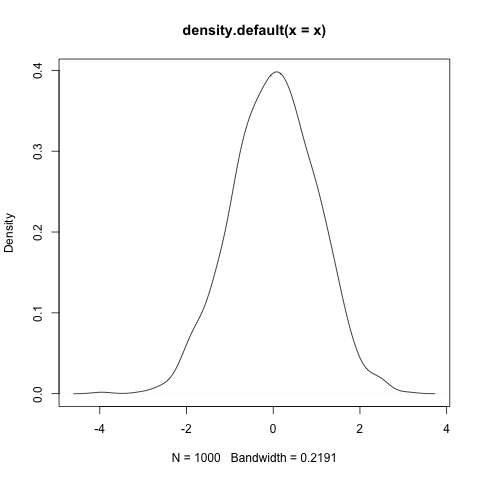

In [19]:
%%R
x <- rnorm(1000) # Create random data
plot(density(x)) # Plot density

## Indexes

Both data frames and series always have an "index".  Sometimes that index is meaningful and sometimes it's not (it can just be the row number).  Either way, indexes are an important aspect of many operations in pandas and they also open a lot of doors.

In [20]:
d = pd.DataFrame(np.random.randn(10, 3), 
                 columns=['x', 'y', 'z'], 
                 index=['Row {}'.format(i) for i in range(10)])
d.index.name = 'Row'
print(d.shape)
d

(10, 3)


,x,y,z
Row,,,
Row 0,-0.133858,1.396897,0.209444
Row 1,-0.310150,-1.900739,-0.984842
Row 2,0.115454,0.743591,-0.267427
Row 3,-2.663161,-0.245570,-0.365216
Row 4,-1.502453,-0.000275,0.076141
Row 5,0.670754,1.178575,0.066969
Row 6,-1.788664,-0.141144,1.585421
Row 7,-1.552588,0.346093,-0.163566
Row 8,-1.652207,2.669725,-1.215533


In [21]:
d = d.reset_index()
d

,Row,x,y,z
0,Row 0,-0.133858,1.396897,0.209444
1,Row 1,-0.310150,-1.900739,-0.984842
2,Row 2,0.115454,0.743591,-0.267427
3,Row 3,-2.663161,-0.245570,-0.365216
4,Row 4,-1.502453,-0.000275,0.076141
5,Row 5,0.670754,1.178575,0.066969
6,Row 6,-1.788664,-0.141144,1.585421
7,Row 7,-1.552588,0.346093,-0.163566
8,Row 8,-1.652207,2.669725,-1.215533
9,Row 9,-1.449598,0.347123,-2.060717


In [22]:
d = d.set_index(['Row', 'x'])
d

,,y,z
Row,x,,
Row 0,-0.133858,1.396897,0.209444
Row 1,-0.310150,-1.900739,-0.984842
Row 2,0.115454,0.743591,-0.267427
Row 3,-2.663161,-0.245570,-0.365216
Row 4,-1.502453,-0.000275,0.076141
Row 5,0.670754,1.178575,0.066969
Row 6,-1.788664,-0.141144,1.585421
Row 7,-1.552588,0.346093,-0.163566
Row 8,-1.652207,2.669725,-1.215533


In [23]:
d.columns

Index(['y', 'z'], dtype='object')

In [24]:
d.index

MultiIndex(levels=[['Row 0', 'Row 1', 'Row 2', 'Row 3', 'Row 4', 'Row 5', 'Row 6', 'Row 7', 'Row 8', 'Row 9'], [-2.6631611124, -1.78866377013, -1.65220653219, -1.55258797334, -1.50245343819, -1.44959777568, -0.310149768352, -0.133858259881, 0.115454053611, 0.670753650943]],
           labels=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [7, 6, 8, 0, 4, 9, 1, 3, 2, 5]],
           names=['Row', 'x'])

# Part 2 - Data Operations
<hr>

Pandas has a huge number of built-in, well optimized (i.e. cythonized) commands for doing vectorized operations as part of grouping, sorting, aggregating, filtering, pivoting, etc. workflows.  Here are a few examples:

In [25]:
# Getting ahead of things here, but scikit-learn has a lot of built-in datasets for this sort of testing
from sklearn import datasets 

# Load in the famouse Iris dataset
iris = datasets.load_iris()

Scikit-learn datasets are always given as numpy matrices, so knowing how to convert those to pandas data frames is a good skill to have (it comes up in plenty of other places too).

In [26]:
iris.data[:5], np.unique(iris.target)

(array([[ 5.1,  3.5,  1.4,  0.2],
        [ 4.9,  3. ,  1.4,  0.2],
        [ 4.7,  3.2,  1.3,  0.2],
        [ 4.6,  3.1,  1.5,  0.2],
        [ 5. ,  3.6,  1.4,  0.2]]), array([0, 1, 2]))

In [27]:
iris.feature_names, iris.target_names

(['sepal length (cm)',
  'sepal width (cm)',
  'petal length (cm)',
  'petal width (cm)'],
 array(['setosa', 'versicolor', 'virginica'], 
       dtype='<U10'))

In [28]:
# Map target values to the corresponding names
iris.target_names[iris.target][:6]

array(['setosa', 'setosa', 'setosa', 'setosa', 'setosa', 'setosa'], 
      dtype='<U10')

In [29]:
# Create a data frame containing only the features first
d = pd.DataFrame(iris.data, columns=iris.feature_names)
d.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [30]:
# Now add in the "Target" value which in this case is the species of the flower
d = d.assign(species=iris.target_names[iris.target])

# This would work just as well, but the .assign method is good to know for chaining operations together
# d['species'] = iris.target_names[iris.target]

d.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [31]:
# The data frame still maintains a numpy matrix under the hood, and you can get at it with .values
d.values[:5]

array([[5.1, 3.5, 1.4, 0.2, 'setosa'],
       [4.9, 3.0, 1.4, 0.2, 'setosa'],
       [4.7, 3.2, 1.3, 0.2, 'setosa'],
       [4.6, 3.1, 1.5, 0.2, 'setosa'],
       [5.0, 3.6, 1.4, 0.2, 'setosa']], dtype=object)

Having "(cm)" in every column is annoying, so they can easily be renamed through functional utilities:

In [32]:
d = d.rename(columns=lambda c: c.replace(' (cm)', ''))

# Alternative (but generally worse methods)
# d.columns = ['sepal length', 'sepal width', 'petal length', 'species']
# d.columns = [c.replace(' (cm)', '') for c in d]

d.head()

,sepal length,sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


### Projection (aka selecting columns)

In [33]:
d[['sepal length', 'species']].head()

,sepal length,species
0,5.1,setosa
1,4.9,setosa
2,4.7,setosa
3,4.6,setosa
4,5.0,setosa


In [34]:
# Alternatively (and better)
d.filter(items=['sepal length', 'species']).head()

,sepal length,species
0,5.1,setosa
1,4.9,setosa
2,4.7,setosa
3,4.6,setosa
4,5.0,setosa


In [35]:
# Or
d.filter(regex='sepal length|species').head()

,sepal length,species
0,5.1,setosa
1,4.9,setosa
2,4.7,setosa
3,4.6,setosa
4,5.0,setosa


### Filtering

In [36]:
d[d['species'] == 'setosa'].head(2)

,sepal length,sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa


In [37]:
d[(d['species'] == 'setosa') & (d['petal length'] > 1.4)].head(2)

,sepal length,sepal width,petal length,petal width,species
3,4.6,3.1,1.5,0.2,setosa
5,5.4,3.9,1.7,0.4,setosa


In [38]:
d.query("species == 'setosa'").head(2)

,sepal length,sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa


In [39]:
d.loc[lambda x: x['species'] == 'setosa'].head(2)

,sepal length,sepal width,petal length,petal width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa


In [40]:
d.query("species == 'setosa' and petal length > 1.4").head(2)

SyntaxError: invalid syntax (<unknown>, line 1)

### Grouping and Aggregating

In [41]:
d.groupby('species').mean()

,sepal length,sepal width,petal length,petal width
species,,,,
setosa,5.006,3.418,1.464,0.244
versicolor,5.936,2.770,4.260,1.326
virginica,6.588,2.974,5.552,2.026


In [42]:
d.groupby('species').describe().head(10)

petal length  petal width  sepal length  sepal width
species                                                               
setosa     count     50.000000     50.00000      50.00000    50.000000
           mean       1.464000      0.24400       5.00600     3.418000
           std        0.173511      0.10721       0.35249     0.381024
           min        1.000000      0.10000       4.30000     2.300000
           25%        1.400000      0.20000       4.80000     3.125000
           50%        1.500000      0.20000       5.00000     3.400000
           75%        1.575000      0.30000       5.20000     3.675000
           max        1.900000      0.60000       5.80000     4.400000
versicolor count     50.000000     50.00000      50.00000    50.000000
           mean       4.260000      1.32600       5.93600     2.770000

In [43]:
d.groupby('species')['petal length'].mean()

species
setosa        1.464
versicolor    4.260
virginica     5.552
Name: petal length, dtype: float64

In [44]:
d.groupby('species')['petal length'].agg({'mean': np.mean, 'median': np.median})

,median,mean
species,,
setosa,1.50,1.464
versicolor,4.35,4.260
virginica,5.55,5.552


In [45]:
d.groupby('species')[['petal length']].mean()

,petal length
species,
setosa,1.464
versicolor,4.260
virginica,5.552


### Applying Custom Logic

In [46]:
# Apply a function of some kind to each numeric column in the frame
d.select_dtypes(include=[np.number]).apply(lambda col: col > col.mean()).head()

,sepal length,sepal width,petal length,petal width
0,False,True,False,False
1,False,False,False,False
2,False,True,False,False
3,False,True,False,False
4,False,True,False,False


In [47]:
# Apply custom logic per group

# First, let's create a new variable by binning the sepal length value
d = d.assign(sepal_length_bucket=lambda x: pd.cut(x['sepal length'], bins=5))
d.head()

,sepal length,sepal width,petal length,petal width,species,sepal_length_bucket
0,5.1,3.5,1.4,0.2,setosa,"(5.02, 5.74]"
1,4.9,3.0,1.4,0.2,setosa,"(4.296, 5.02]"
2,4.7,3.2,1.3,0.2,setosa,"(4.296, 5.02]"
3,4.6,3.1,1.5,0.2,setosa,"(4.296, 5.02]"
4,5.0,3.6,1.4,0.2,setosa,"(4.296, 5.02]"


In [48]:
# Now get the most commonly occurring species amongst each sepal length bin
d.groupby('sepal_length_bucket').apply(lambda g: g['species'].value_counts().idxmax())

sepal_length_bucket
(4.296, 5.02]       setosa
(5.02, 5.74]        setosa
(5.74, 6.46]     virginica
(6.46, 7.18]     virginica
(7.18, 7.9]      virginica
dtype: object

### Sorting

In [49]:
d['petal length'].describe()

count    150.000000
mean       3.758667
std        1.764420
min        1.000000
25%        1.600000
50%        4.350000
75%        5.100000
max        6.900000
Name: petal length, dtype: float64

In [50]:
d.sort_values('petal length').head(3)

,sepal length,sepal width,petal length,petal width,species,sepal_length_bucket
22,4.6,3.6,1.0,0.2,setosa,"(4.296, 5.02]"
13,4.3,3.0,1.1,0.1,setosa,"(4.296, 5.02]"
14,5.8,4.0,1.2,0.2,setosa,"(5.74, 6.46]"


In [51]:
d.sort_values('petal length', ascending=False).head(3)

,sepal length,sepal width,petal length,petal width,species,sepal_length_bucket
118,7.7,2.6,6.9,2.3,virginica,"(7.18, 7.9]"
122,7.7,2.8,6.7,2.0,virginica,"(7.18, 7.9]"
117,7.7,3.8,6.7,2.2,virginica,"(7.18, 7.9]"


# Part 2 - Reshaping
<hr>

IMO this the hardest thing to conceptualize in data analysis, but it comes up very frequently.  "Reshaping" data means being able to move data from wide to long formats effectively, usually in an effort to reach a "[tidy](https://ramnathv.github.io/pycon2014-r/explore/tidy.html)" representation.  It's hard to imagine something better than Pandas for that though.

In [52]:
# Load the "Boston Housing Price" dataset so we have something practical to work with
bost = datasets.load_boston()
print(bost['DESCR'])

Boston House Prices dataset

Notes
------
Data Set Characteristics:  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive
    
    :Median Value (attribute 14) is usually the target

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
      

In [53]:
d_bost = pd.DataFrame(bost.data, columns=bost.feature_names)\
    .assign(PRICE=bost.target)\
    .filter(items=['CRIM', 'RM', 'AGE', 'PRICE'])
d_bost.head()

,CRIM,RM,AGE,PRICE
0,0.00632,6.575,65.2,24.0
1,0.02731,6.421,78.9,21.6
2,0.02729,7.185,61.1,34.7
3,0.03237,6.998,45.8,33.4
4,0.06905,7.147,54.2,36.2


In [54]:
d = d_bost.apply(pd.qcut, q=[0, .25, .5, .75, 1], labels=['Low', 'Med', 'High', 'Very High'])
d.head()

,CRIM,RM,AGE,PRICE
0,Low,High,Med,High
1,Low,High,High,High
2,Low,Very High,Med,Very High
3,Low,Very High,Med,Very High
4,Low,Very High,Med,Very High


### Unstack / Stack Operators

In [55]:
d.groupby(['PRICE', 'AGE']).size().head()

PRICE  AGE      
Low    Low           1
       Med           5
       High         42
       Very High    79
Med    Low          23
dtype: int64

In [56]:
# Count houses by age and price group
d_pr_v_age = d.groupby(['PRICE', 'AGE']).size().unstack()
d_pr_v_age

AGE,Low,Med,High,Very High
PRICE,,,,
Low,1,5,42,79
Med,23,44,35,27
High,50,43,26,7
Very High,53,34,23,14


In [57]:
d_pr_v_age.stack().head()

PRICE  AGE      
Low    Low           1
       Med           5
       High         42
       Very High    79
Med    Low          23
dtype: int64

In [58]:
# Compute counts as percentages instead
(d_pr_v_age / d_pr_v_age.sum().sum()).mul(100).round(2)

AGE,Low,Med,High,Very High
PRICE,,,,
Low,0.20,0.99,8.30,15.61
Med,4.55,8.70,6.92,5.34
High,9.88,8.50,5.14,1.38
Very High,10.47,6.72,4.55,2.77


In [59]:
(d_pr_v_age / d_pr_v_age.sum().sum()).mul(100).round(2)\
    .style.background_gradient(cmap='autumn_r')

In [60]:
# Count by age, price, and number of rooms
d_pvar = d.groupby(['PRICE', 'AGE', 'RM']).size().unstack().unstack()
d_pvar

RM          Low                         Med                        High        \
AGE         Low   Med  High Very High   Low   Med  High Very High   Low   Med   
PRICE                                                                           
Low         1.0   2.0  14.0      41.0   NaN   NaN  16.0      16.0   NaN   2.0   
Med        15.0  18.0   4.0      12.0   6.0  22.0  21.0       3.0   2.0   4.0   
High        4.0   6.0   4.0       1.0  16.0  12.0   8.0       2.0  28.0  20.0   
Very High   NaN   NaN   3.0       2.0   1.0   2.0   NaN       1.0   9.0   3.0   

RM                       Very High                        
AGE       High Very High       Low   Med  High Very High  
PRICE                                                     
Low        7.0      16.0       NaN   1.0   5.0       6.0  
Med        9.0      10.0       NaN   NaN   1.0       2.0  
High       8.0       4.0       2.0   5.0   6.0       NaN  
Very High  2.0       2.0      43.0  29.0  18.0       9.0

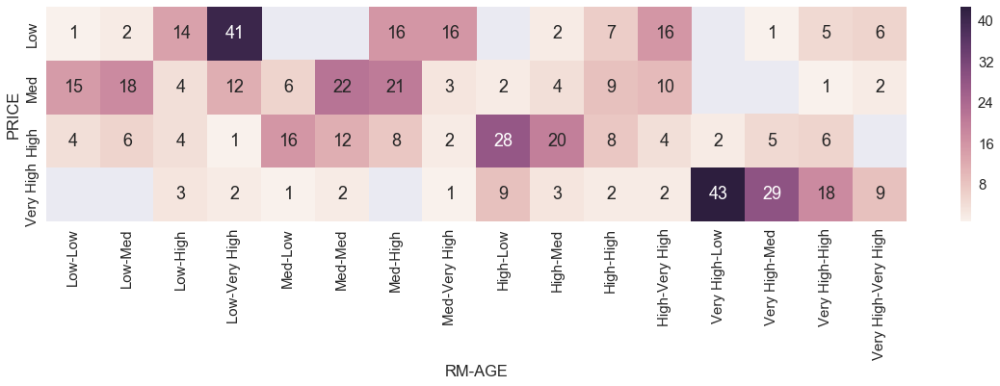

In [61]:
# Highlighting differences in counts
plt.figure(figsize=(20, 4))
sns.set(font_scale=1.5)
sns.heatmap(d_pvar, annot=True)

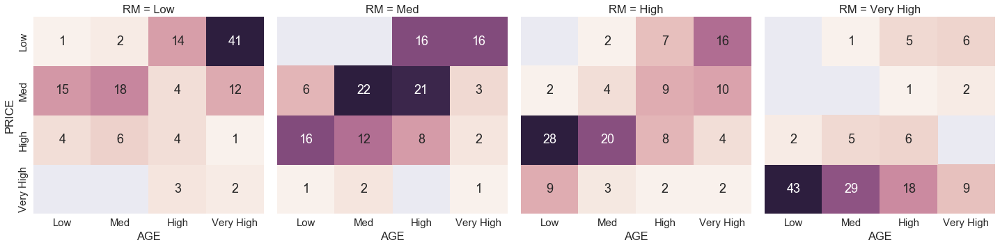

In [62]:
d_hm = d.groupby(['PRICE', 'AGE', 'RM']).size()
d_hm = d_hm.rename('Count').reset_index()

def heatmap(data, **kwargs):
    d = data.pivot_table(index='PRICE', columns='AGE', values='Count', aggfunc='sum')
    return sns.heatmap(d, cbar=False, annot=True)

sns.FacetGrid(d_hm, col='RM', size=5)\
    .map_dataframe(heatmap)\
    .set_xlabels('AGE')\
    .set_ylabels('PRICE')

### Pivot / Melt

Pandas also has two functions, ```pivot_table``` and ```melt``` that can accomplish many of the same things as ```stack``` and ```unstack```.

The main difference between the two sets of commands then is that ```pivot_table/melt``` operate starting with unindexed data frames, or at least, data frames with indexes you don't care about.  This makes them much more familiar for SAS/R users that might not be used to indexes being a formal part of data structures.

The ```stack/unstack``` commands on the other hand, operate solely by moving data from row indexes to column indexes (or vise versa).  They're much more specific to pandas (aka more "pandorable") because of this, but they are generally more intuitive when you get into a step-wise flow of operations.

In [63]:
d.head()

,CRIM,RM,AGE,PRICE
0,Low,High,Med,High
1,Low,High,High,High
2,Low,Very High,Med,Very High
3,Low,Very High,Med,Very High
4,Low,Very High,Med,Very High


In [64]:
d_pr_v_age = d.pivot_table(index='PRICE', columns='AGE', values='RM', aggfunc='count')
d_pr_v_age

AGE,Low,Med,High,Very High
PRICE,,,,
Low,1,5,42,79
Med,23,44,35,27
High,50,43,26,7
Very High,53,34,23,14


In [65]:
d_melt = d_pr_v_age.copy()
d_melt.columns = d_melt.columns.astype(str)
d_melt = d_melt.reset_index()
d_melt.head()

AGE,PRICE,Low,Med,High,Very High
0,Low,1,5,42,79
1,Med,23,44,35,27
2,High,50,43,26,7
3,Very High,53,34,23,14


In [66]:
pd.melt(d_melt, id_vars=['PRICE'], value_name='COUNT')

,PRICE,AGE,COUNT
0,Low,Low,1
1,Med,Low,23
2,High,Low,50
3,Very High,Low,53
4,Low,Med,5
5,Med,Med,44
6,High,Med,43
7,Very High,Med,34
8,Low,High,42
9,Med,High,35


# Part 3 - Visualization
<hr>

There are 3 major aspects of visualization in Python (IMO):

1. **Matplotlib** -- The core static visualization library for scientific python users (it's very detailed)
2. **Seaborn** -- Matplotlib wrappers, has gained the most traction but is still specific to python
3. **Bokeh/Plot.ly** -- Interactive visualization tools (generate HTML instead of images)

In [67]:
d = pd.DataFrame(bost.data, columns=bost.feature_names)\
    .assign(PRICE=bost.target)\
    .filter(items=['CRIM', 'RM', 'AGE', 'PRICE'])
d.head()

,CRIM,RM,AGE,PRICE
0,0.00632,6.575,65.2,24.0
1,0.02731,6.421,78.9,21.6
2,0.02729,7.185,61.1,34.7
3,0.03237,6.998,45.8,33.4
4,0.06905,7.147,54.2,36.2


## Matplotlib

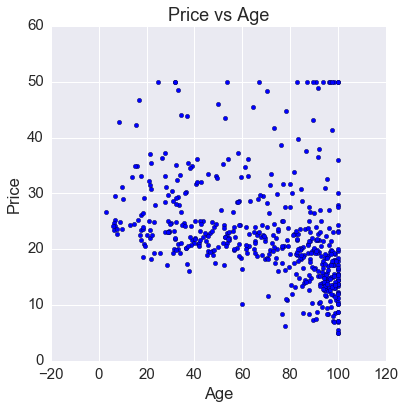

In [68]:
# The "pyplot" module (aliased as "plt" here) has many functions for different kinds of visuals
fig = plt.figure(figsize=(6, 6))
plt.scatter(d['AGE'], d['PRICE']) # Scatter plot example
plt.title('Price vs Age')
plt.xlabel('Age')
plt.ylabel('Price')

## Matplotlib via Pandas

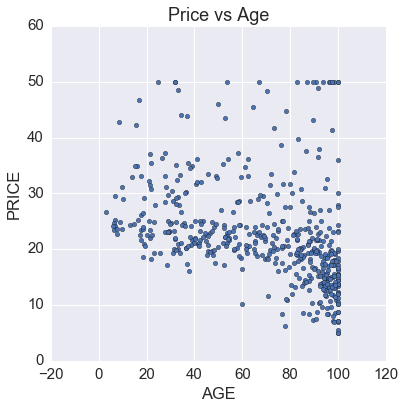

In [69]:
# The "plot" function attached to DataFrames and Series are really more like a Pandas plotting library,
# but it's using Matplotlib under the hood
d.plot(kind='scatter', x='AGE', y='PRICE', figsize=(6, 6), title='Price vs Age')

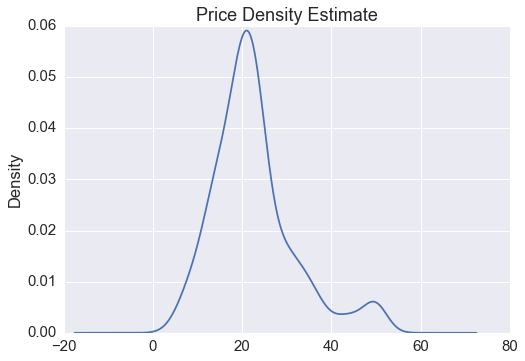

In [70]:
d['PRICE'].plot(kind='kde', title='Price Density Estimate')

## Seaborn

In [71]:
d_hist = d.copy()
d_hist[['AGE', 'CRIM']] = d_hist[['AGE', 'CRIM']]\
    .apply(pd.qcut, q=[0, .33, .66, 1], labels=['Low', 'Med', 'High'])
d_hist.head()

,CRIM,RM,AGE,PRICE
0,Low,6.575,Med,24.0
1,Low,6.421,Med,21.6
2,Low,7.185,Med,34.7
3,Low,6.998,Low,33.4
4,Low,7.147,Low,36.2


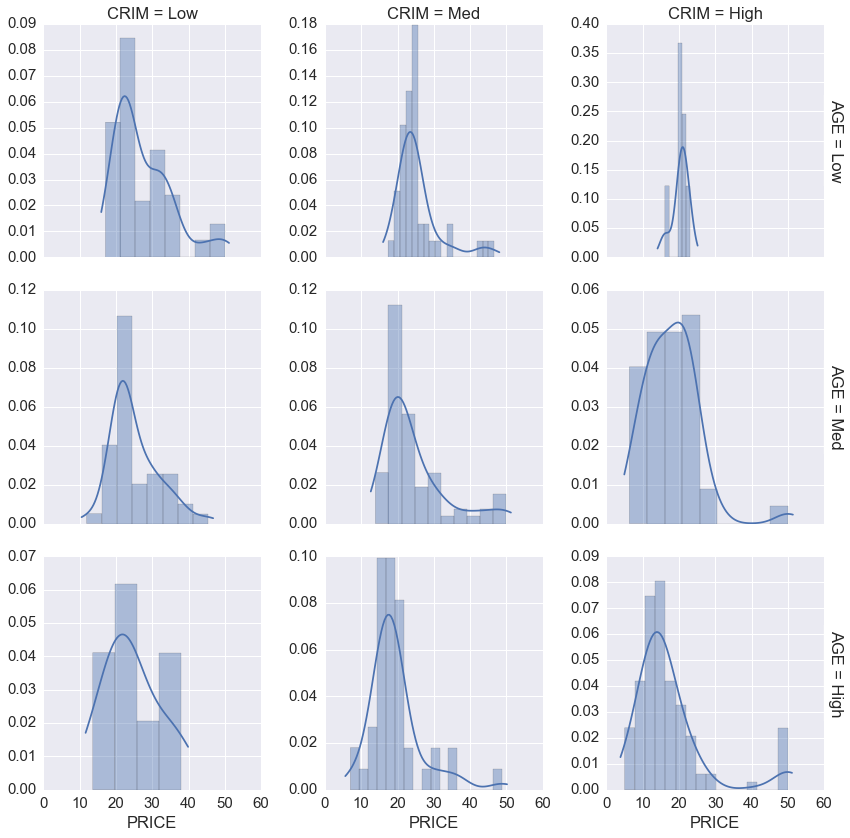

In [72]:
sns.FacetGrid(d_hist, col="CRIM",  row="AGE", sharex=True, sharey=False, margin_titles=True, size=4)\
    .map(sns.distplot, 'PRICE')

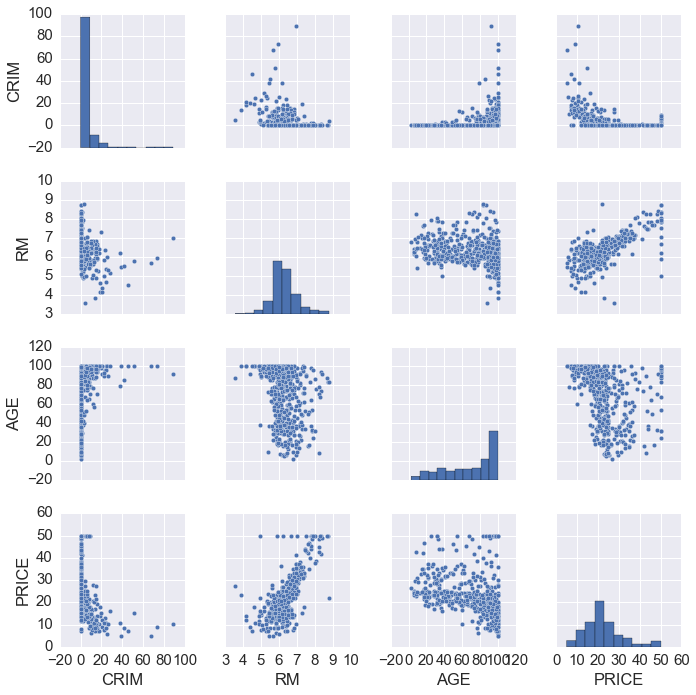

In [73]:
sns.pairplot(d)

## Plot.ly

Interactive graphics are nice, but being "interactive" isn't just a frill.  These things can make visualizations way more practical and lead to a lot less coding -- Plot.ly is a great example of this:

In [74]:
# Create a large dataset with a large number of different timeseries
dates = pd.date_range('2016-01-01', '2016-07-01', freq='10T')
len(dates), dates[:5]

(26209, DatetimeIndex(['2016-01-01 00:00:00', '2016-01-01 00:10:00',
                '2016-01-01 00:20:00', '2016-01-01 00:30:00',
                '2016-01-01 00:40:00'],
               dtype='datetime64[ns]', freq='10T'))

In [76]:
def get_wave_pattern(x):
    n = len(x)
    i = np.arange(n)
    
    a1 = .1 + np.random.rand(1) * .3
    f1 = 100
    w1 = (i % f1) / float(f1)
    
    a2 = .1 + np.random.rand(1) * .8
    f2 = 10000
    w2 = (i % f2) / float(f2)
    
    return a1 * np.sin(w1 * 2 * np.pi) + a2 * np.sin(w2 * 2 * np.pi) + x

np.random.seed(1)
n_ts = 6
d = pd.DataFrame(np.random.randn(len(dates), n_ts) * .3, index=dates).add_prefix('TS').apply(get_wave_pattern)
d.head()

,TS0,TS1,TS2,TS3,TS4,TS5
2016-01-01 00:00:00,0.487304,-0.183527,-0.158452,-0.321891,0.259622,-0.690462
2016-01-01 00:10:00,0.544096,-0.220022,0.121129,-0.060279,0.447350,-0.610894
2016-01-01 00:20:00,-0.055502,-0.098568,0.390867,-0.300960,-0.034327,-0.249087
2016-01-01 00:30:00,0.074296,0.199738,-0.254328,0.386788,0.296496,0.172087
2016-01-01 00:40:00,0.352055,-0.172074,0.063818,-0.223164,-0.045830,0.187435


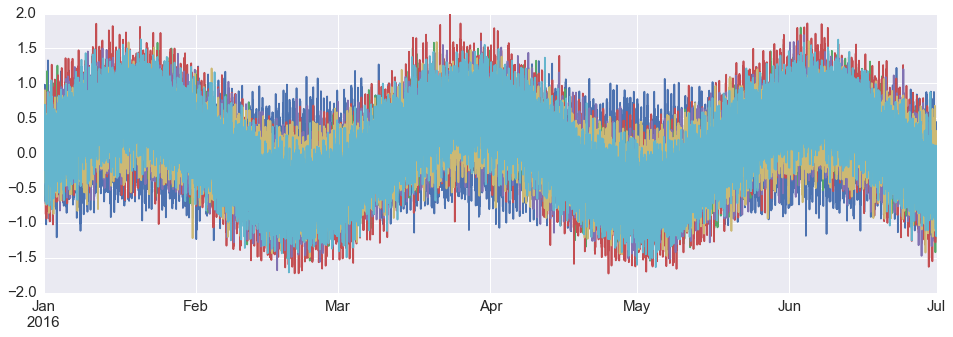

In [77]:
# First, show this data with Matplotlib for comparison
d.plot(figsize=(16, 5), legend=False)

In [78]:
d.iplot()

In [80]:
# Saving html plots to a file
fig = d.iplot(asFigure=True)
plty.offline.plot(fig, filename='/tmp/plotly_test.html')

'file:///tmp/plotly_test.html'

In [79]:
d.rolling(50, min_periods=1, center=True).mean().iplot()